# Computer Vision Assignment 2

Name: Jamwal Snigdha <br>
Matriculation Number: G2304207H


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# importing all required packages
import numpy as np
import imutils
import cv2
from glob2 import glob
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

## 1. Simple Image Stitching

In [ ]:
'''
Function to detect all the keypoints and features of a given image using the
Difference of Gaussian (DoG) keypoint detector and the SIFT feature extractor.
'''
def detectAndDescribe(image):
  # convert the image to grayscale
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  # detect and extract features from the image
  descriptor = cv2.xfeatures2d.SIFT_create()
  (kps, features) = descriptor.detectAndCompute(image, None)
  kps = np.float32([kp.pt for kp in kps])
  # return a tuple of keypoints and features
  return (kps, features)

'''
Function to match the features of the images.
1. The Euclidean distance is calculated exhaustively between all feature vectors
from both images and the pairs of descriptors that have the smallest distance are found
2. Uses KNN to get the top 2 matches of every feature
3. The Lowe's ratio test is applied to remove false-positive matches
4. Get the Homography matrix and remove the outliers using RANSAC
'''
def featureMatching(kps1, kps2, features1, features2, ratio, reprojThresh):
  # compute the raw matches and initialize the list of actual
  # matches
  matcher = cv2.DescriptorMatcher_create("BruteForce")
  rawMatches = matcher.knnMatch(features1, features2, 2)
  matches = []
  # loop over the raw matches
  for m in rawMatches:
    # ensure the distance is within a certain ratio of each
    # other (i.e. Lowe's ratio test)
    if len(m) == 2 and m[0].distance < m[1].distance * ratio:
      matches.append((m[0].trainIdx, m[0].queryIdx))
  # computing a homography requires at least 4 matches
  if len(matches) > 4:
    # construct the two sets of points
    pts1 = np.float32([kps1[i] for (_, i) in matches])
    pts2 = np.float32([kps2[i] for (i, _) in matches])
    # compute the homography between the two sets of points
    (H, status) = cv2.findHomography(pts1, pts2, cv2.RANSAC,
      reprojThresh)
    # return the matches along with the homograpy matrix
    # and status of each matched point
    return (matches, H, status)
  # otherwise, no homograpy could be computed
  return None

'''
The main function to perform image stitching which calls all the above functions and performs the
stitching of the images
'''
def stitchImages(img1Path, img2Path, ratio=0.75, reprojThresh=4.0, direction = "horizontal"):

	img1 = cv2.imread(img1Path)
	img2 = cv2.imread(img2Path)
	#detect keypoints and extract local invariant descriptors from them
	(kps1, features1) = detectAndDescribe(img1)
	(kps2, features2) = detectAndDescribe(img2)
	# match features between the two images
	M = featureMatching(kps1, kps2,
		features1, features2, ratio, reprojThresh)
	# if the match is None, then there aren't enough matched keypoints to create a panorama
	if M is None:
		return None

	# otherwise, apply a perspective warp to stitch the images together
	(matches, H, status) = M
	if direction == "horizontal":
		result = cv2.warpPerspective(img1, H,(img1.shape[1] + img2.shape[1], max(img1.shape[0], img2.shape[0])))
	elif direction == "vertical":
		result = cv2.warpPerspective(img1, H,(img1.shape[0] + img2.shape[0], max(img1.shape[1], img2.shape[1])))
	result[0:img2.shape[0], 0:img2.shape[1]] = img2

	# return the stitched image
	return result


The algorithm only gives good result if the images are given in the correct order and the direction in which they need to be stitched is also given
Input order for Horizontal direction: Right to left <br>
Input order for Vertical direction: Bottom to top <br>
By default the images arestitched horizontally


In [ ]:
## path to the folder where all the original images are stored
path = "/content/drive/MyDrive/Semester 1/AI6121 Computer Vision/Assignment 2/Data/"

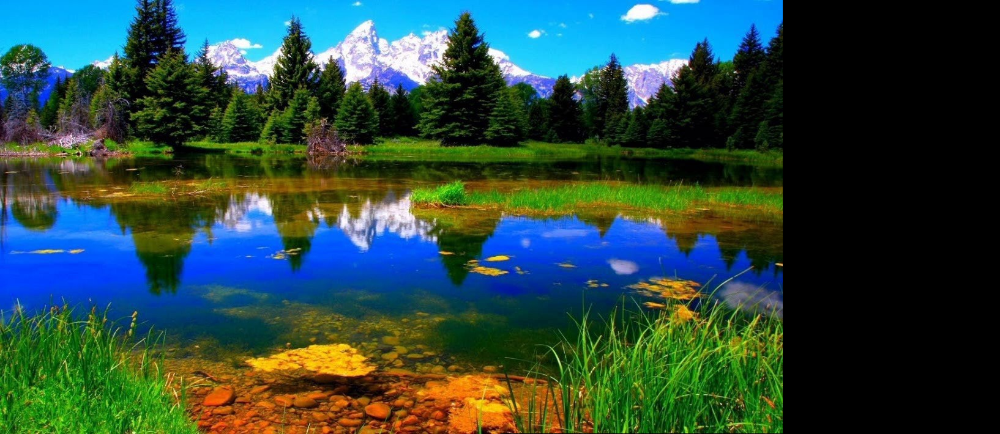

In [ ]:
## Image pair 01
cv2_imshow(stitchImages(path + "image pairs_01_02.jpg", path + "image pairs_01_01.jpg"))

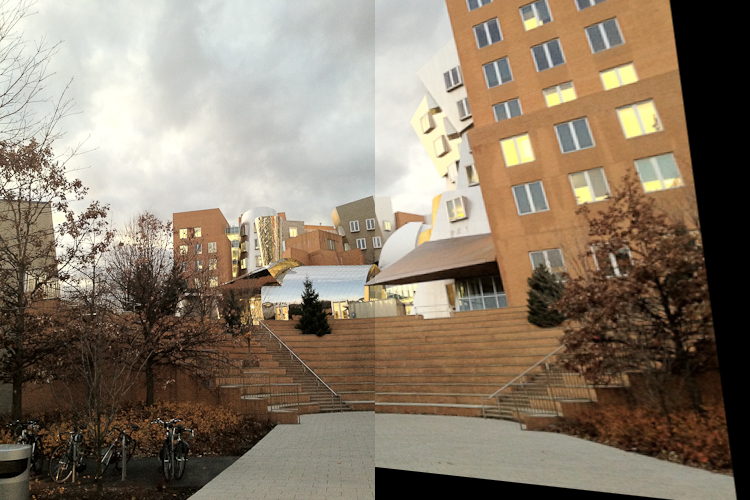

In [ ]:
## Image pair 02
cv2_imshow(stitchImages(path + "image pairs_02_01.png", path + "image pairs_02_02.png"))

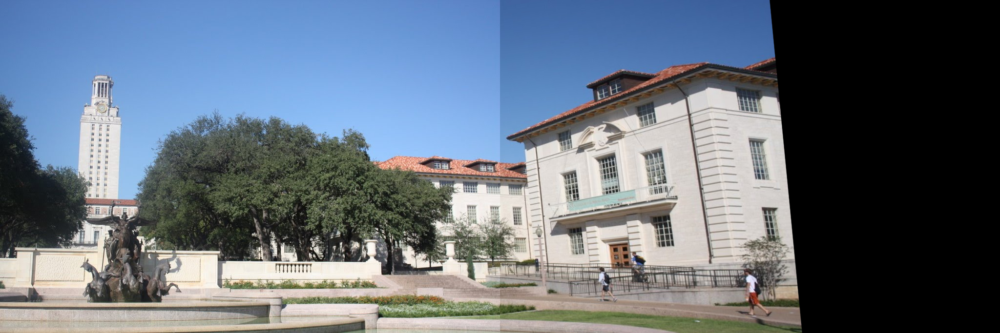

In [ ]:
## Image pair 03
cv2_imshow(stitchImages(path + "/image pairs_03_02.jpg", path + "/image pairs_03_01.jpg"))

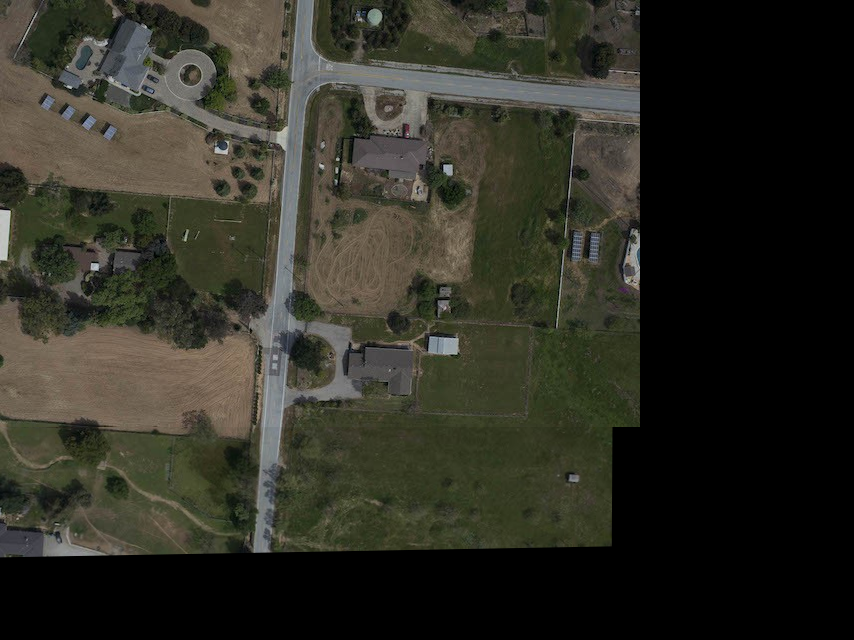

In [ ]:
## Image pair 04
cv2_imshow(stitchImages(path + "/image pairs_04_02.jpg", path + "/image pairs_04_01.jpg", direction = "vertical"))

## 2. Features Invariant Image Stitching using the OpenCV

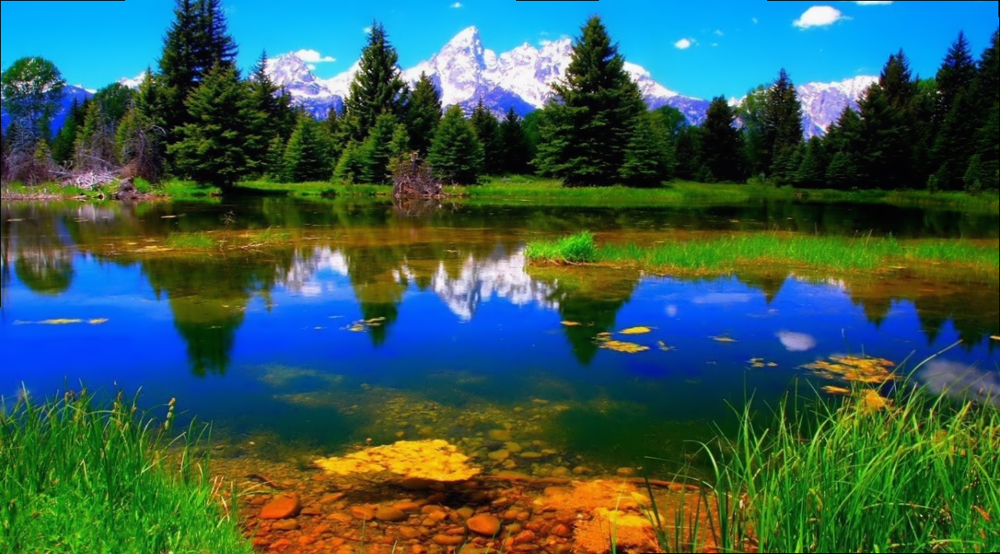

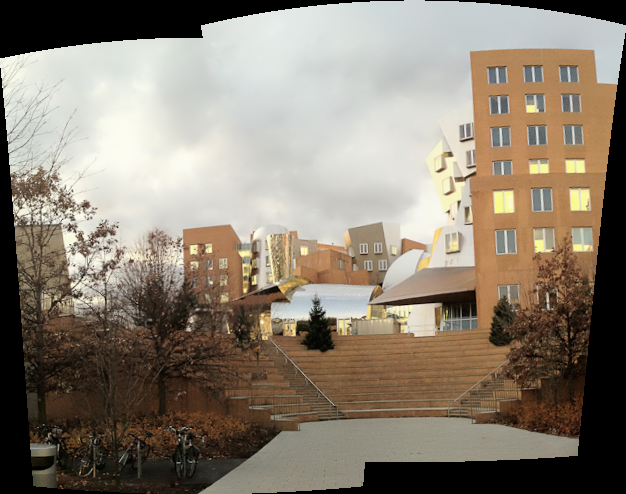

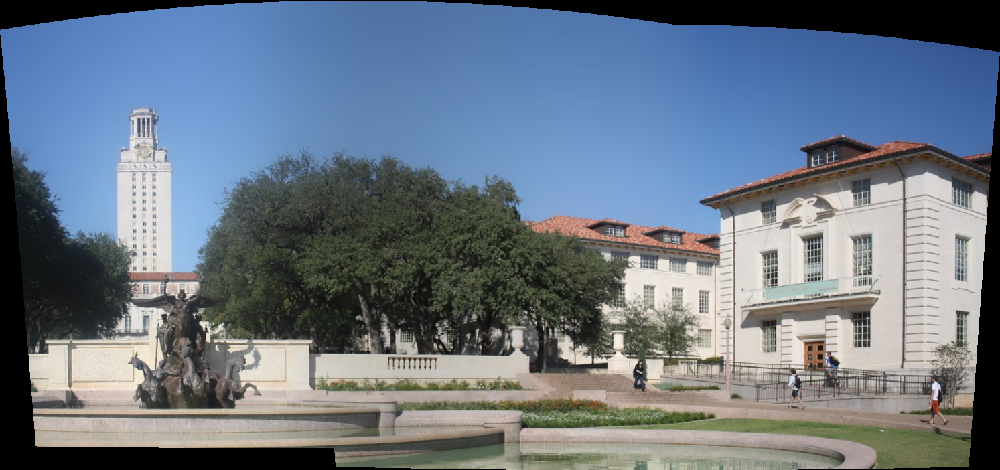

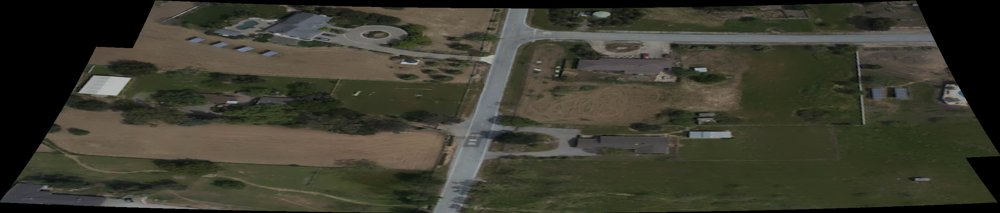

In [ ]:
imagesPaths = sorted(glob(path+"/*"))
for index in range(0, 7,2):
  img1_path = imagesPaths[index]
  img1 = cv2.imread(img1_path)
  img2_path = imagesPaths[index+1]
  img2 = cv2.imread(img2_path)
  stitcher = cv2.Stitcher_create()
  (status, stitched) = stitcher.stitch([img1, img2])
  cv2_imshow(stitched)